In [1]:
import importlib
import subprocess
import sys

packages = [
    'pandas',
    'numpy',
    'matplotlib',
    'seaborn',
    'sklearn',
    'plotly',
    'dash',
    'json'
]

def check_and_install_packages(packages):
    for package in packages:
        try:
            importlib.import_module(package)
            print(f"{package} is already installed.")
        except ImportError:
            print(f"{package} not found. Installing...")
            subprocess.check_call([sys.executable, "-m", "pip", "install", package])
            print(f"{package} has been installed.")

if __name__ == "__main__":
    check_and_install_packages(packages)
    print("All required packages are now installed.")
    
    # Comprehensive import checks
    try:
        import pandas as pd
        print("pandas imported successfully.")
    except ImportError:
        print("Warning: pandas could not be imported.")
    
    try:
        import numpy as np
        print("numpy imported successfully.")
    except ImportError:
        print("Warning: numpy could not be imported.")
    
    try:
        import matplotlib as mpl
        import matplotlib.pyplot as plt
        print("matplotlib and matplotlib.pyplot imported successfully.")
    except ImportError:
        print("Warning: matplotlib or matplotlib.pyplot could not be imported.")
    
    try:
        import seaborn as sns
        print("seaborn imported successfully.")
    except ImportError:
        print("Warning: seaborn could not be imported.")
    
    try:
        import sklearn
        from sklearn.preprocessing import StandardScaler
        print("sklearn and sklearn.preprocessing.StandardScaler imported successfully.")
    except ImportError:
        print("Warning: sklearn or sklearn.preprocessing.StandardScaler could not be imported.")
    
    try:
        import plotly
        import plotly.graph_objects as go
        import plotly.express as px
        print("plotly, plotly.graph_objects, and plotly.express imported successfully.")
    except ImportError:
        print("Warning: plotly, plotly.graph_objects, or plotly.express could not be imported.")
    
    try:
        from dash import Dash, dcc, html, Input, Output
        print("dash components (Dash, dcc, html, Input, Output) imported successfully.")
    except ImportError:
        print("Warning: Some dash components could not be imported.")
    
    try:
        import json
        print("json imported successfully.")
    except ImportError:
        print("Warning: json could not be imported.")

    print("\nAll import checks completed.")

pandas is already installed.
numpy is already installed.
matplotlib is already installed.
seaborn is already installed.
sklearn is already installed.
plotly is already installed.
dash is already installed.
json is already installed.
All required packages are now installed.
pandas imported successfully.
numpy imported successfully.
matplotlib and matplotlib.pyplot imported successfully.
seaborn imported successfully.
sklearn and sklearn.preprocessing.StandardScaler imported successfully.
plotly, plotly.graph_objects, and plotly.express imported successfully.
dash components (Dash, dcc, html, Input, Output) imported successfully.
json imported successfully.

All import checks completed.


In [2]:
df = pd.read_csv("C:\\olymip\\dataset_olympics.csv") # reading the csv

In [3]:
def process_null_values(df):
    # Fill null values in 'Medal' column with 'N'
    df['Medal'] = df['Medal'].fillna('N')

    # Define groupings for progressive filling
    groupings = [
        ['NOC', 'Sport', 'Year','Sex','Medal'],
        ['Sport', 'Year','Sex', 'Medal'],
        ['Sport', 'Year','Sex'],
        ['Sport','Sex']
    ]

    # Function to fill null values for a given column
    def fill_nulls(column):
        for group in groupings:
            avg = df.groupby(group)[column].transform('mean')
            df.loc[df[column].isna(), column] = avg

    # Process Age, Height, and Weight
    for column in ['Age', 'Height', 'Weight']:
        fill_nulls(column)

    return df

In [4]:
df= process_null_values(df) # filling the nulls

In [5]:
df.loc[pd.isna(df['Height']), 'Sport'].unique()

array(['Art Competitions', 'Polo', 'Cricket', 'Racquets', 'Motorboating',
       'Military Ski Patrol', 'Croquet', 'Jeu De Paume', 'Roque',
       'Alpinism', 'Basque Pelota'], dtype=object)

# Historical Olympic Sports: No Longer Part of Modern Games

These sports are historical and no longer part of the modern Olympics, which explains the lack of data in some columns.

# Plotting the Percentage of Women and Men Participating in Every Other Olympics

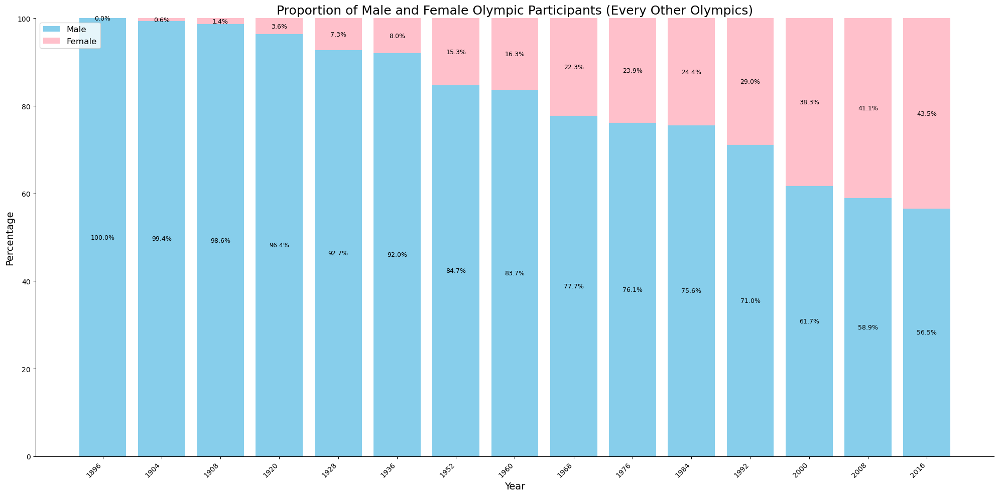

In [6]:

# Assuming df is your DataFrame with Olympic data
all_years = df[df['Season'] == 'Summer']
all_years = sorted(all_years['Year'].unique())
selected_years = [year for i, year in enumerate(all_years) if i % 2 == 0]

# Filter the dataframe for selected years
df_filtered = df[df['Year'].isin(selected_years)]

# Group and calculate percentages
group = df_filtered.groupby(['Year'])['Sex'].value_counts().unstack(fill_value=0)
group = group.reset_index()
group = group.rename(columns={'M': 'm', 'F': 'f'})
group = group[['Year', 'm', 'f']]

# Calculate percentages
group['total'] = group['m'] + group['f']
group['m_percent'] = group['m'] / group['total'] * 100
group['f_percent'] = group['f'] / group['total'] * 100

# Create the stacked bar chart
fig, ax = plt.subplots(figsize=(20, 10))

# Create x-values as a range of integers
x = range(len(group['Year']))

# Plot the data with bars next to each other
bars = ax.bar(x, group['m_percent'], label='Male', color='skyblue', width=0.8)
ax.bar(x, group['f_percent'], bottom=group['m_percent'], label='Female', color='pink', width=0.8)

# Customize the chart
plt.title('Proportion of Male and Female Olympic Participants (Every Other Olympics)', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Percentage', fontsize=14)
plt.legend(loc='upper left', fontsize=12)

# Set x-ticks to be the years
plt.xticks(x, group['Year'], rotation=45, ha='right', fontsize=10)

# Add percentage labels on the bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{height:.1f}%', ha='center', va='center', fontsize=9)
    
    f_percent = group.iloc[i]['f_percent']
    ax.text(bar.get_x() + bar.get_width()/2., height + f_percent/2,
            f'{f_percent:.1f}%', ha='center', va='center', fontsize=9)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Set y-axis to go from 0 to 100
ax.set_ylim(0, 100)

# Adjust layout and display the chart
plt.tight_layout()
plt.show()

# plottig the poprtion of male and female partecped per sport in the year 2016

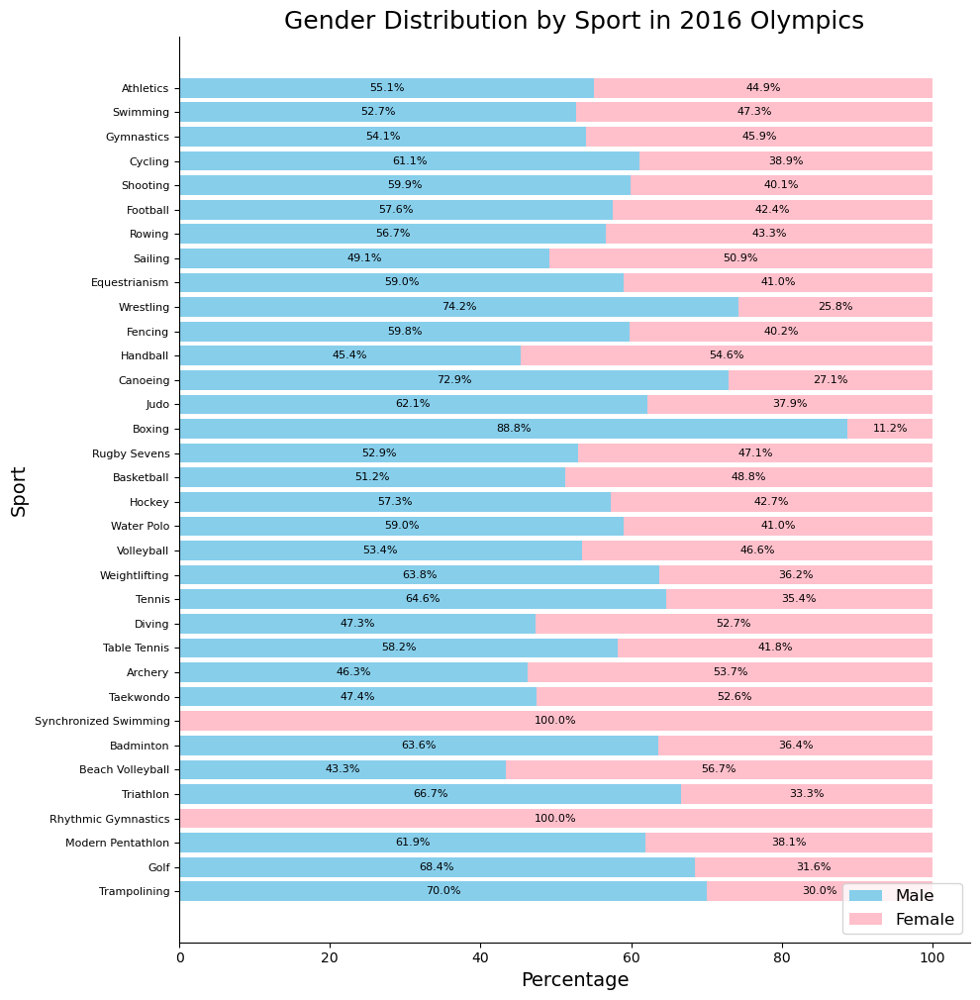

In [7]:


# Filter the dataframe for 2016 Olympics
df_2016 = df[df['Year'] == 2016]

# Group by Sport and calculate percentages
group = df_2016.groupby('Sport')['Sex'].value_counts().unstack(fill_value=0)
group = group.reset_index()
group = group.rename(columns={'M': 'm', 'F': 'f'})
group['total'] = group['m'] + group['f']
group['m_percent'] = group['m'] / group['total'] * 100
group['f_percent'] = group['f'] / group['total'] * 100

# Sort by total participants (optional, comment out if not needed)
group = group.sort_values('total', ascending=True)

# Create the horizontal stacked bar chart
fig, ax = plt.subplots(figsize=(10, len(group) * 0.3))  # Adjust figure height based on number of sports

# Plot the data
bars = ax.barh(group['Sport'], group['m_percent'], label='Male', color='skyblue', height=0.8)
ax.barh(group['Sport'], group['f_percent'], left=group['m_percent'], label='Female', color='pink', height=0.8)

# Customize the chart
plt.title('Gender Distribution by Sport in 2016 Olympics', fontsize=18)
plt.xlabel('Percentage', fontsize=14)
plt.ylabel('Sport', fontsize=14)
plt.legend(loc='lower right', fontsize=12)
plt.xticks(range(0, 101, 20), fontsize=10)  # Set x-axis ticks from 0 to 100
ax.tick_params(axis='y', labelsize=8)  # Adjust sport names font size

# Add percentage labels on the bars
for i, bar in enumerate(bars):
    width = bar.get_width()
    if width > 10:  # Only show label if segment is wide enough
        ax.text(width/2, bar.get_y() + bar.get_height()/2, f'{width:.1f}%',
                ha='center', va='center', fontsize=8)
    
    f_percent = group.iloc[i]['f_percent']
    if f_percent > 10:
        ax.text(width + f_percent/2, bar.get_y() + bar.get_height()/2, f'{f_percent:.1f}%',
                ha='center', va='center', fontsize=8)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Adjust layout and display the chart
plt.tight_layout()
plt.show()

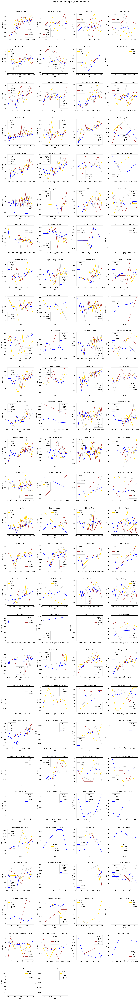

In [8]:
def plot_height_trends_by_sport(df, sports=None, n_cols=2):
    # Filter out NaN heights at the start
    df = df.dropna(subset=['Height'])
    
    if sports is None:
        sports = df['Sport'].unique()
    elif isinstance(sports, str):
        sports = [sports]
    
    n_sports = len(sports)
    n_rows = (n_sports + n_cols - 1) // n_cols
    fig = plt.figure(figsize=(10*n_cols, 5*n_rows))
    
    # Adjust the position of the title using 'y'
    fig.suptitle('Height Trends by Sport, Sex, and Medal', fontsize=16, y=0.95)  # Lowered 'y' to make the title closer
    
    medal_colors = {'Gold': 'gold', 'Silver': 'silver', 'Bronze': 'brown', 'N': 'blue'}
    
    for idx, sport in enumerate(sports):
        sport_data = df[df['Sport'] == sport]
        # Plot for Men
        ax_men = fig.add_subplot(n_rows, n_cols*2, idx*2 + 1)
        men_data = sport_data[sport_data['Sex'] == 'M']
        for medal in ['Gold', 'Silver', 'Bronze', 'N']:
            medal_data = men_data[men_data['Medal'] == medal]
            mean_heights = medal_data.groupby('Year')['Height'].mean().dropna()  # Remove any NaN after mean calculation
            ax_men.plot(mean_heights.index, mean_heights.values, label=medal, color=medal_colors[medal])
        ax_men.set_title(f'{sport} - Men')
        ax_men.set_xlabel('Year')
        ax_men.set_ylabel('Height (cm)')
        ax_men.legend(title='Medal')
        
        # Plot for Women
        ax_women = fig.add_subplot(n_rows, n_cols*2, idx*2 + 2)
        women_data = sport_data[sport_data['Sex'] == 'F']
        for medal in ['Gold', 'Silver', 'Bronze', 'N']:
            medal_data = women_data[women_data['Medal'] == medal]
            mean_heights = medal_data.groupby('Year')['Height'].mean().dropna()  # Remove any NaN after mean calculation
            ax_women.plot(mean_heights.index, mean_heights.values, label=medal, color=medal_colors[medal])
        ax_women.set_title(f'{sport} - Women')
        ax_women.set_xlabel('Year')
        ax_women.set_ylabel('Height (cm)')
        ax_women.legend(title='Medal')
    
    # Adjust spacing between plots and the title
    plt.subplots_adjust(top=0.94, hspace=0.4, wspace=0.3)  # Reducing the top margin to move title closer to plots

    plt.show()

# Usage:
plot_height_trends_by_sport(df)


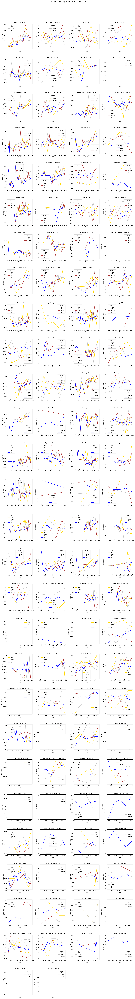

In [9]:

def plot_weight_trends_by_sport(df, sports=None, n_cols=2):
    # Filter out NaN weights at the start
    df = df.dropna(subset=['Weight'])
    
    if sports is None:
        sports = df['Sport'].unique()
    elif isinstance(sports, str):
        sports = [sports]
    
    n_sports = len(sports)
    n_rows = (n_sports + n_cols - 1) // n_cols
    fig = plt.figure(figsize=(10*n_cols, 5*n_rows))
    fig.suptitle('Weight Trends by Sport, Sex, and Medal', fontsize=16)
    medal_colors = {'Gold': 'gold', 'Silver': 'silver', 'Bronze': 'brown', 'N': 'blue'}
    
    for idx, sport in enumerate(sports):
        sport_data = df[df['Sport'] == sport]
        # Plot for Men
        ax_men = fig.add_subplot(n_rows, n_cols*2, idx*2 + 1)
        men_data = sport_data[sport_data['Sex'] == 'M']
        for medal in ['Gold', 'Silver', 'Bronze', 'N']:
            medal_data = men_data[men_data['Medal'] == medal]
            mean_weights = medal_data.groupby('Year')['Weight'].mean().dropna()  # Remove any NaN after mean calculation
            ax_men.plot(mean_weights.index, mean_weights.values, label=medal, color=medal_colors[medal])
        ax_men.set_title(f'{sport} - Men')
        ax_men.set_xlabel('Year')
        ax_men.set_ylabel('Weight (kg)')
        ax_men.legend(title='Medal')
        # Plot for Women
        ax_women = fig.add_subplot(n_rows, n_cols*2, idx*2 + 2)
        women_data = sport_data[sport_data['Sex'] == 'F']
        for medal in ['Gold', 'Silver', 'Bronze', 'N']:
            medal_data = women_data[women_data['Medal'] == medal]
            mean_weights = medal_data.groupby('Year')['Weight'].mean().dropna()  # Remove any NaN after mean calculation
            ax_women.plot(mean_weights.index, mean_weights.values, label=medal, color=medal_colors[medal])
        ax_women.set_title(f'{sport} - Women')
        ax_women.set_xlabel('Year')
        ax_women.set_ylabel('Weight (kg)')
        ax_women.legend(title='Medal')
    plt.subplots_adjust(top=0.96, hspace=0.4, wspace=0.3)
    plt.show()

# Usage:
plot_weight_trends_by_sport(df)

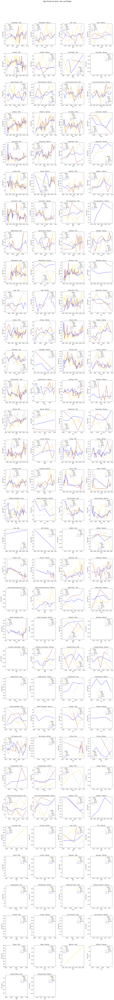

In [10]:
def plot_age_trends_by_sport(df, sports=None, n_cols=2):
    # Filter out NaN ages at the start
    df = df.dropna(subset=['Age'])
    
    if sports is None:
        sports = df['Sport'].unique()
    elif isinstance(sports, str):
        sports = [sports]
    
    n_sports = len(sports)
    n_rows = (n_sports + n_cols - 1) // n_cols
    fig = plt.figure(figsize=(10*n_cols, 5*n_rows))
    fig.suptitle('Age Trends by Sport, Sex, and Medal', fontsize=16)
    medal_colors = {'Gold': 'gold', 'Silver': 'silver', 'Bronze': 'brown', 'N': 'blue'}
    
    for idx, sport in enumerate(sports):
        sport_data = df[df['Sport'] == sport]
        # Plot for Men
        ax_men = fig.add_subplot(n_rows, n_cols*2, idx*2 + 1)
        men_data = sport_data[sport_data['Sex'] == 'M']
        for medal in ['Gold', 'Silver', 'Bronze', 'N']:
            medal_data = men_data[men_data['Medal'] == medal]
            mean_ages = medal_data.groupby('Year')['Age'].mean().dropna()  # Remove any NaN after mean calculation
            ax_men.plot(mean_ages.index, mean_ages.values, label=medal, color=medal_colors[medal])
        ax_men.set_title(f'{sport} - Men')
        ax_men.set_xlabel('Year')
        ax_men.set_ylabel('Age (years)')
        ax_men.legend(title='Medal')
        # Plot for Women
        ax_women = fig.add_subplot(n_rows, n_cols*2, idx*2 + 2)
        women_data = sport_data[sport_data['Sex'] == 'F']
        for medal in ['Gold', 'Silver', 'Bronze', 'N']:
            medal_data = women_data[women_data['Medal'] == medal]
            mean_ages = medal_data.groupby('Year')['Age'].mean().dropna()  # Remove any NaN after mean calculation
            ax_women.plot(mean_ages.index, mean_ages.values, label=medal, color=medal_colors[medal])
        ax_women.set_title(f'{sport} - Women')
        ax_women.set_xlabel('Year')
        ax_women.set_ylabel('Age (years)')
        ax_women.legend(title='Medal')
    plt.subplots_adjust(top=0.96, hspace=0.4, wspace=0.3)
    plt.show()

# Usage:
plot_age_trends_by_sport(df)

# Complex Data Visualization: Trends in Olympic Sports

These graphs contain a wealth of information that's challenging to fully convey. Key observations include:

1. Missing Data: Some sports have blank areas, straight lines, or missing medals.
2. Interesting Trends: For example, hockey players are getting taller over the years.

Conclusions:
- To find a good profile, we need to consider a three-dimensional perspective.
- Age, weight, and height are interdependent variables.

Proposed Solution: 
Build a 3D Plotly app to better visualize these relationships and capture the complexity of the data.

In [16]:
# Initialize Dash app
app = Dash(__name__)

def find_best_bounding_box(sport_df, n_divisions=5, random_state=42, n_initializations=50, n_refinements=25):
    features = sport_df[['Age', 'Height', 'Weight']].values
    scaler = StandardScaler()
    normalized_data = scaler.fit_transform(features)
    all_medals = np.isin(sport_df['Medal'].values, ['Gold', 'Silver', 'Bronze'])
    total_athletes = len(sport_df)
    overall_medal_prob = np.mean(all_medals)
    best_box = None
    best_improvement = 1
    
    main_random_state = np.random.RandomState(random_state)
    
    for i in range(n_initializations):
        seed = main_random_state.randint(1, 10000)
        random_state_for_init = np.random.RandomState(seed)
        min_bounds = random_state_for_init.uniform(low=normalized_data.min(axis=0), high=normalized_data.max(axis=0))
        max_bounds = random_state_for_init.uniform(low=min_bounds, high=normalized_data.max(axis=0))
        
        for _ in range(n_refinements):
            for dim in range(3):
                for bound in ['min', 'max']:
                    original_value = min_bounds[dim] if bound == 'min' else max_bounds[dim]
                    step = (max_bounds[dim] - min_bounds[dim]) / n_divisions
                    new_values = original_value + np.arange(-1, 2) * step
                    
                    for new_value in new_values:
                        if bound == 'min':
                            temp_min_bounds = min_bounds.copy()
                            temp_min_bounds[dim] = new_value
                            temp_max_bounds = max_bounds
                        else:
                            temp_max_bounds = max_bounds.copy()
                            temp_max_bounds[dim] = new_value
                            temp_min_bounds = min_bounds
                        
                        temp_min_bounds_original = scaler.inverse_transform(temp_min_bounds.reshape(1, -1))[0]
                        temp_max_bounds_original = scaler.inverse_transform(temp_max_bounds.reshape(1, -1))[0]
                        
                        in_box_mask = (
                            (sport_df['Age'] >= temp_min_bounds_original[0]) &
                            (sport_df['Age'] <= temp_max_bounds_original[0]) &
                            (sport_df['Height'] >= temp_min_bounds_original[1]) &
                            (sport_df['Height'] <= temp_max_bounds_original[1]) &
                            (sport_df['Weight'] >= temp_min_bounds_original[2]) &
                            (sport_df['Weight'] <= temp_max_bounds_original[2])
                        )
                        in_box_size = np.sum(in_box_mask)
                        
                        if 0.03 <= in_box_size / total_athletes <= 0.25:
                            in_box_medals = sport_df.loc[in_box_mask, 'Medal'].isin(['Gold', 'Silver', 'Bronze'])
                            medal_prob = np.mean(in_box_medals)
                            improvement = medal_prob / overall_medal_prob
                            
                            if medal_prob > overall_medal_prob and improvement > best_improvement:
                                best_improvement = improvement
                                best_box = {
                                    'min_bounds': temp_min_bounds,
                                    'max_bounds': temp_max_bounds,
                                    'min_bounds_original': temp_min_bounds_original,
                                    'max_bounds_original': temp_max_bounds_original,
                                    'size': in_box_size,
                                    'medal_prob': medal_prob,
                                    'improvement': improvement,
                                    'in_box_mask': in_box_mask
                                }
                    
                    if bound == 'min':
                        min_bounds = best_box['min_bounds'] if best_box else min_bounds
                    else:
                        max_bounds = best_box['max_bounds'] if best_box else max_bounds
    
    return best_box, overall_medal_prob, total_athletes

# Define sports list
sports = ['Gymnastics', 'Swimming', 'Athletics', 'Shooting', 'Sailing', 'Fencing', 
          'Rowing', 'Boxing', 'Equestrianism', 'Weightlifting', 'Cycling', 
          'Diving', 'Basketball', 'Football', 'Wrestling']

# Calculate max values and bounding boxes
max_values = {}
bounding_boxes = {}

for sport in sports:
    sport_df = df[(df['Sport'] == sport) & (df['Sex'] == 'M')]
    max_values[sport] = {
        'Age': sport_df['Age'].max(),
        'Height': sport_df['Height'].max(),
        'Weight': sport_df['Weight'].max()
    }
    best_box, overall_medal_prob, total_athletes = find_best_bounding_box(sport_df)
    bounding_boxes[sport] = {
        'box': best_box,
        'overall_medal_prob': overall_medal_prob
    }

# Define the app layout
app.layout = html.Div([
    html.H1("Olympic Sports Dashboard", style={'textAlign': 'center', 'marginTop': '20px'}),
    html.Div([
        html.Div([
            html.Label("Select Sport:"),
            dcc.Dropdown(
                id='sport-dropdown',
                options=[{'label': sport, 'value': sport} for sport in sports],
                value=sports[0],
                style={'width': '100%'}
            )
        ], style={'width': '30%', 'display': 'inline-block', 'verticalAlign': 'top'}),
        html.Div([
            html.Label("Select Medals:"),
            dcc.Checklist(
                id='medal-checklist',
                options=[
                    {'label': 'Gold', 'value': 'Gold'},
                    {'label': 'Silver', 'value': 'Silver'},
                    {'label': 'Bronze', 'value': 'Bronze'},
                    {'label': 'N', 'value': 'N'}
                ],
                value=['Gold', 'Silver', 'Bronze', 'N'],
                inline=True
            )
        ], style={'width': '50%', 'display': 'inline-block', 'verticalAlign': 'top'}),
        html.Div([
            html.Label("Show Bounding Box:"),
            dcc.Checklist(
                id='show-bounding-box',
                options=[{'label': 'Show', 'value': 'show'}],
                value=[],
                inline=True
            )
        ], style={'width': '20%', 'display': 'inline-block', 'verticalAlign': 'top'})
    ], style={'padding': '20px', 'marginBottom': '20px'}),
    html.Div([
        dcc.Graph(id='3d-scatter-plot', style={'height': '80vh'})
    ], style={'padding': '20px'})
], style={'padding': '20px', 'maxWidth': '1400px', 'margin': 'auto'})

@app.callback(
    Output('3d-scatter-plot', 'figure'),
    [Input('sport-dropdown', 'value'),
     Input('medal-checklist', 'value'),
     Input('show-bounding-box', 'value')]
)
def update_graph(selected_sport, selected_medals, show_bounding_box):
    filtered_df = df[(df['Sport'] == selected_sport) & (df['Sex'] == 'M')]
    total_sample_size = len(filtered_df)
    filtered_df = filtered_df[filtered_df['Medal'].isin(selected_medals)]
    
    fig = px.scatter_3d(filtered_df, 
                        x='Age', 
                        y='Height', 
                        z='Weight',
                        color='Medal',
                        color_discrete_map={'Gold': 'gold', 'Silver': 'silver', 'Bronze': '#cd7f32', 'N': 'blue'},
                        hover_name='Name',
                        hover_data=['Year'],
                        title=f'Age, Height, and Weight Distribution for {selected_sport} (Male)')
    
    fig.update_layout(
        scene=dict(
            xaxis_title='Age',
            yaxis_title='Height',
            zaxis_title='Weight',
            xaxis=dict(range=[0, max_values[selected_sport]['Age']]),
            yaxis=dict(range=[0, max_values[selected_sport]['Height']]),
            zaxis=dict(range=[0, max_values[selected_sport]['Weight']])
        ),
        legend_title='Medal',
        margin=dict(l=0, r=0, b=0, t=40),
        height=700,
        uirevision='constant'
    )
    
    if show_bounding_box and bounding_boxes[selected_sport]['box'] is not None:
        box = bounding_boxes[selected_sport]['box']
        overall_medal_prob = bounding_boxes[selected_sport]['overall_medal_prob']
        x_min, y_min, z_min = box['min_bounds_original']
        x_max, y_max, z_max = box['max_bounds_original']
        
        cube = go.Mesh3d(
            x=[x_min, x_max, x_max, x_min, x_min, x_max, x_max, x_min],
            y=[y_min, y_min, y_max, y_max, y_min, y_min, y_max, y_max],
            z=[z_min, z_min, z_min, z_min, z_max, z_max, z_max, z_max],
            i=[7, 0, 0, 0, 4, 4, 6, 6, 4, 0, 3, 2],
            j=[3, 4, 1, 2, 5, 6, 5, 2, 0, 1, 6, 3],
            k=[0, 7, 2, 3, 6, 7, 1, 1, 5, 5, 7, 6],
            color='rgba(255, 0, 0, 0.2)',
            opacity=0.6,
            name='Bounding Box'
        )
        fig.add_trace(cube)
        
        stats_text = (
            f"Bounding Box Statistics:<br>"
            f"Age: {x_min:.1f} - {x_max:.1f} years<br>"
            f"Height: {y_min:.1f} - {y_max:.1f} cm<br>"
            f"Weight: {z_min:.1f} - {z_max:.1f} kg<br>"
            f"Sample size in box: {box['size']}<br>"
            f"Total Population size: {total_sample_size}<br>"
            f"% in box: {(box['size'] / total_sample_size) * 100:.1f}%<br>"
            f"Medal Prob in Box: {box['medal_prob']:.2%}<br>"
            f"Overall Medal Prob: {overall_medal_prob:.2%}<br>"
            f"Improvement: {box['improvement']:.2f}x"
        )
        
        fig.add_annotation(
            x=0.05,
            y=0.95,
            xref="paper",
            yref="paper",
            text=stats_text,
            showarrow=False,
            font=dict(size=14),
            align="left",
            bgcolor="rgba(255, 255, 255, 0.8)",
            bordercolor="red",
            borderwidth=2,
            borderpad=4
        )
    
    return fig

if __name__ == '__main__':
    app.run(debug=True, port=8052)

# Note on Version Differences

This version of the dashboard is not the one deployed on the cloud. The main differences (except for changes related to deployment itself) are:

1. The deployed version is split into two parts:
   - The main app (`app.py`)
   - The calculation of the bounding box, which is stored in a JSON file

To view the complete code, please visit my GitHub repository:
[https://github.com/BarakHoffman/Dash_for_Olyimpicts/tree/main](https://github.com/BarakHoffman/Dash_for_Olyimpicts/tree/main)

To see the deployed version of the dashboard on Render, click this link:
[https://dash-for-olyimpicts.onrender.com/](https://dash-for-olyimpicts.onrender.com/)